In [9]:
library(Seurat)
library(Matrix)
library(cowplot)
library(dplyr)
library(clustree)
library(DT)
library(pheatmap)
library(RColorBrewer)
library(gplots)

In [13]:
data_name <- c("CL1-0-P-4", "CL1-0-100-4", "CL1-0-D100-7","CL1-0-D100-14" , 
               "CL1-5-P-4", "CL1-5-100-4", "CL1-5-D100-7" ,"CL1-5-D100-14", 
               "CLS1-P-4", "CLS1-100-4", "CLS1-D100-7", "CLS1-D100-14")
# data_dir <-c('/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/CL1-0-100-4/outs/filtered_gene_bc_matrices/')
data_dir <- c()
for (i in c(1:length(data_name))){
    append_dir <- paste0("/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/", data_name[i], 
                         "/outs/filtered_feature_bc_matrix/")
    data_dir <- c(data_dir, append_dir)
}
#5-Asa2
LABEL <- c("CL1-0-P", "CL1-0-D4", "CL1-0-D7","CL1-0-D14" , 
           "CL1-5-P", "CL1-5-D4", "CL1-5-D7" ,"CL1-5-D14", 
           "CLS1-P", "CLS1-D4", "CLS1-D7", "CLS1-D14")

sc_list = list()

In [11]:
head(data_dir,3)

[1] "/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/CL1-0-P-4/outs/filtered_feature_bc_matrix/"   
[2] "/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/CL1-0-100-4/outs/filtered_feature_bc_matrix/" 
[3] "/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/CL1-0-D100-7/outs/filtered_feature_bc_matrix/"

In [12]:
#what is selection.method vst
for(i in 1:12){
data <- Read10X(data.dir = data_dir[i])
colnames(data) <- paste(colnames(data),i,sep="-")
sc.data <- CreateSeuratObject(counts= data, project = "Project_1", min.cells = 5)#移除只有5個細胞偵測到的gene
sc.data@meta.data$stim <- LABEL[i]
#calculate mitochondria rate
sc.data[["percent.mt"]] <- PercentageFeatureSet(sc.data, pattern = "^MT-",assay = "RNA")
sc.data <- subset(sc.data, subset = percent.mt <= 10)
sc.data <- NormalizeData(object = sc.data, verbose = FALSE) #Normalize
sc.data <- FindVariableFeatures(object = sc.data, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
sc_list[[i]] <- ScaleData(object = sc.data) 
}

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix



In [13]:
#Integrate 12 data set
sc.features <- SelectIntegrationFeatures(object.list = sc_list, nfeatures = 2000, selection.method = "vst")
anchors <- FindIntegrationAnchors(object.list = sc_list, dims = 1:20, anchor.features=sc.features, reference=1)
integrated <- IntegrateData(anchorset = anchors, dims = 1:20) #New Assy

Scaling features for provided objects

Finding anchors between all query and reference datasets

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 10641 anchors

Filtering anchors

	Retained 8054 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 9552 anchors

Filtering anchors

	Retained 5357 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 10570 anchors

Filtering anchors

	Retained 6389 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 12578 anchors

Filtering anchors

	Retained 2934 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 11891 anchors

Filtering anchors

	Retained 3200 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighb

In [407]:
sc_df <- integrated[[]] 
head(sc_df)

,orig.ident,nCount_RNA,nFeature_RNA,stim,percent.mt,integrated_snn_res.0,integrated_snn_res.0.1,integrated_snn_res.0.2,integrated_snn_res.0.3,integrated_snn_res.0.4,integrated_snn_res.0.5,integrated_snn_res.0.6,integrated_snn_res.0.7,integrated_snn_res.0.8,integrated_snn_res.0.9,integrated_snn_res.1,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGAGGATATAC-1,Project_1,34902,5159,CL1-0-P,6.890723,0,0,0,0,0,0,1,0,4,4,4,0
AAACCTGAGGGTCTCC-1,Project_1,57950,6302,CL1-0-P,4.880069,0,4,5,7,7,8,7,7,9,9,9,7
AAACCTGCAAGCCTAT-1,Project_1,28025,4588,CL1-0-P,4.157003,0,1,1,1,1,2,2,2,0,0,0,1
AAACCTGCACAGTCGC-1,Project_1,44234,5269,CL1-0-P,3.759551,0,1,1,1,1,2,2,2,0,0,0,1
AAACCTGCACATTTCT-1,Project_1,50946,5665,CL1-0-P,3.232835,0,0,0,0,0,0,1,0,4,2,4,0
AAACCTGGTTAAAGAC-1,Project_1,48819,5701,CL1-0-P,4.363055,0,4,5,7,7,8,7,7,9,9,9,7


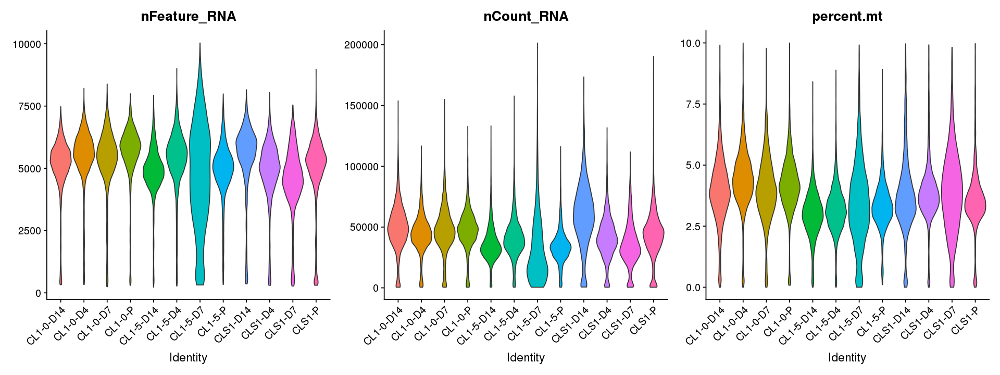

In [15]:
options(repr.plot.width=16, repr.plot.height=6)
VlnPlot(integrated, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3, 
        group.by = 'stim', pt.size = 0)

In [16]:
integrated[[]] %>% group_by(stim) %>% summarise(cell_count = length(nCount_RNA))

stim,cell_count
<chr>,<int>
CL1-0-D14,4135
CL1-0-D4,3776
CL1-0-D7,3171
CL1-0-P,3494
CL1-5-D14,5364
CL1-5-D4,3997
CL1-5-D7,3187
CL1-5-P,4617
CLS1-D14,2492


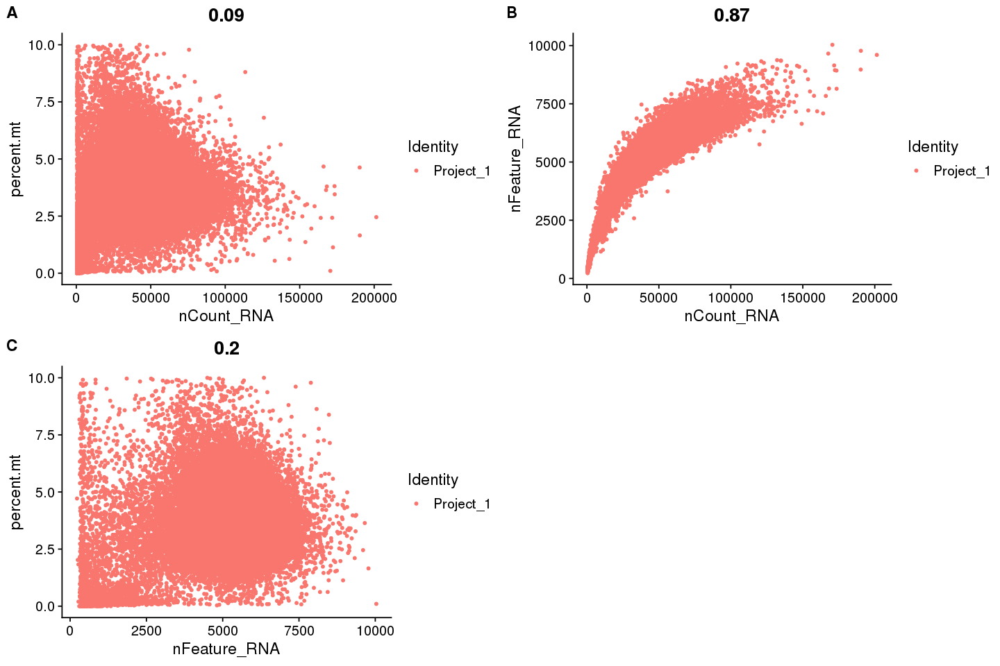

In [17]:
options(repr.plot.width = 12, repr.plot.height = 8)
par(mfrow=c(1,3))
plot1 <- FeatureScatter(integrated, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(integrated, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot3 <- FeatureScatter(integrated, feature1 = "nFeature_RNA", feature2 = "percent.mt")
plot_grid(plot1, plot2, plot3, labels = c("A","B","C"))

CL1-0-P : 3494

CL1-0-D4 : 3776

CL1-0-D7 : 3171

CL1-0-D14 : 4135

CL1-5-P : 4617

CL1-5-D4 : 3997

CL1-5-D7 : 3187

CL1-5-D14 : 5364

CLS1-P : 3194



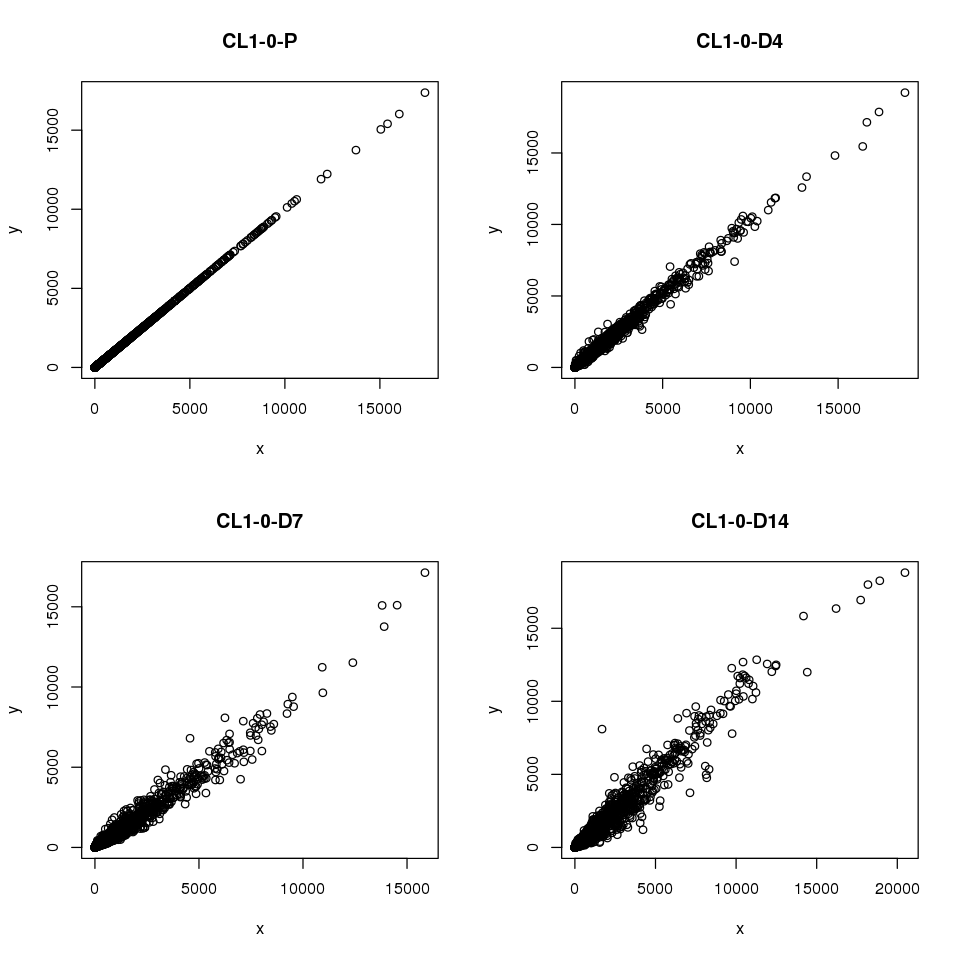

CLS1-D4 : 3299

CLS1-D7 : 3437

CLS1-D14 : 2492



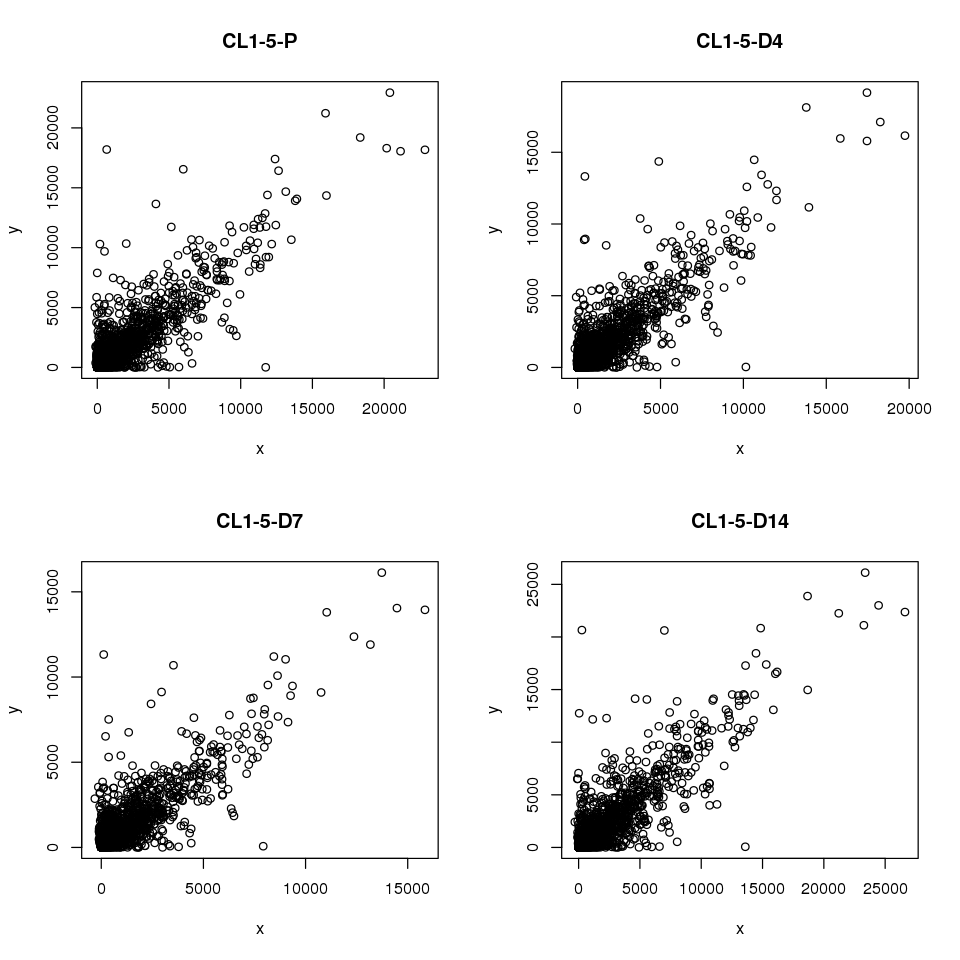

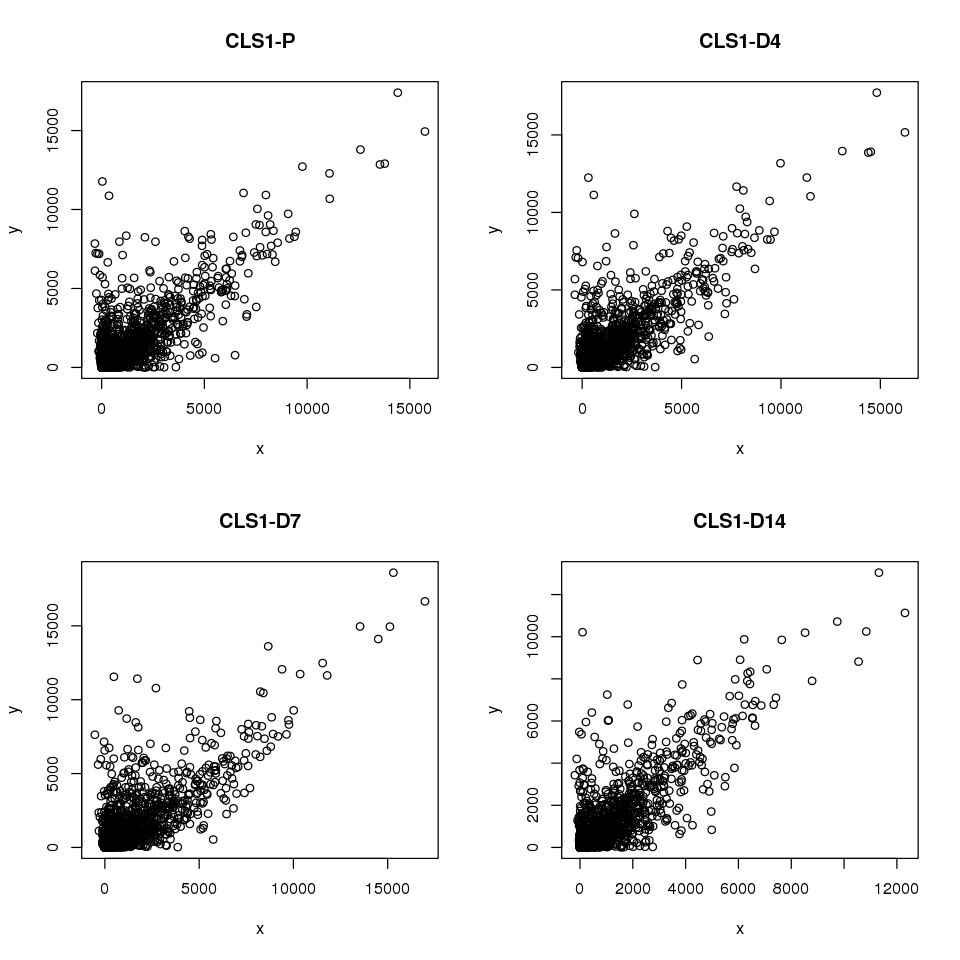

In [18]:
x_tmp<-GetAssayData(object = integrated,slot = 'data',assay = 'integrated')
y_tmp<-GetAssayData(object = integrated,slot = 'data',assay = 'RNA')[rownames(x_tmp) ,colnames(x = integrated) , drop = FALSE]
par(mfrow=c(2,2))
for(i in 1:12){
cells<-rownames(integrated[[]][integrated[[]]$stim==LABEL[i],])
message(paste(LABEL[i],length(cells),sep=" : "))
x<-rowSums(x_tmp[,cells])
y<-rowSums(y_tmp[,cells])
options(repr.plot.width=8, repr.plot.height=8)
plot(x=x,y=y,main=LABEL[i])
    }

In [19]:
# PCA
DefaultAssay(object = integrated) <- "integrated"
options(repr.plot.width=8, repr.plot.height=8)
resolutions <- seq(0, 1, 0.1)
# Run the standard workflow for visualization and clustering
integrated <- ScaleData(object = integrated, verbose = FALSE)
integrated <- RunPCA(object = integrated, npcs = 100, verbose = FALSE)

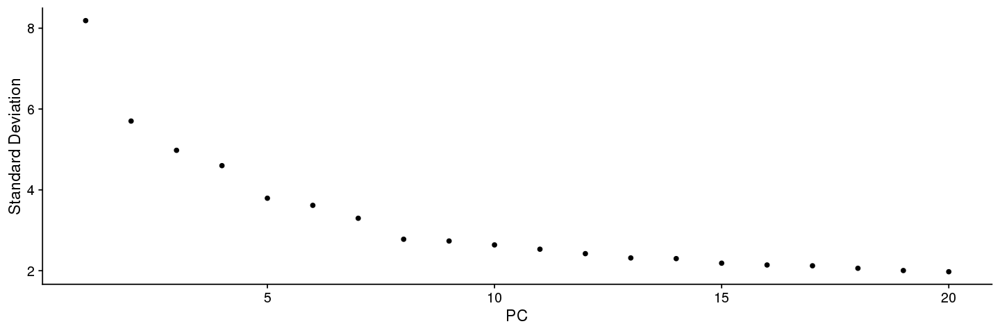

In [20]:
#elbow select
options(repr.plot.width=12, repr.plot.height=4)
ElbowPlot(integrated)

Warning message:
"Removed 140000 rows containing missing values (geom_point)."


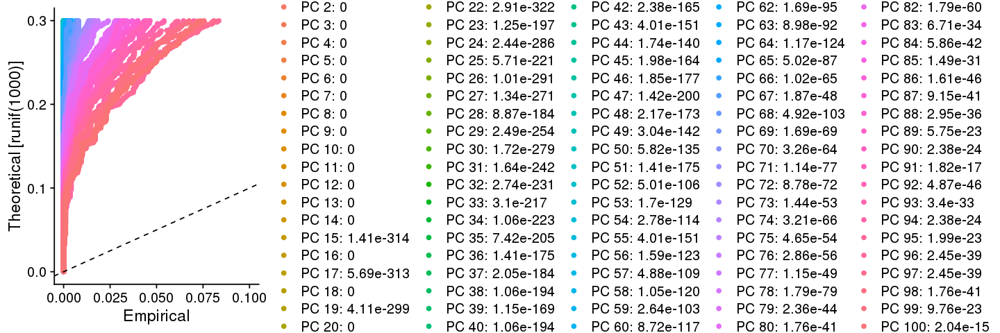

In [22]:
library(future)
plan("multiprocess", workers = 12)
integrated <- JackStraw(integrated, num.replicate = 100, dims = 100)
integrated <- ScoreJackStraw(integrated, dims = 1:100)
JackStrawPlot(integrated, dims = 1:100)

In [23]:
#Cluster the cell
integrated <- FindNeighbors(object = integrated, reduction = "pca", dims = 1:60)
integrated <- FindClusters(integrated, resolution = resolutions)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 3
Elapsed time: 13 seconds


2 singletons identified. 1 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9333
Number of communities: 8
Elapsed time: 21 seconds


2 singletons identified. 6 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9059
Number of communities: 10
Elapsed time: 21 seconds


2 singletons identified. 8 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8884
Number of communities: 14
Elapsed time: 21 seconds


2 singletons identified. 12 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8732
Number of communities: 16
Elapsed time: 18 seconds


2 singletons identified. 14 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8612
Number of communities: 20
Elapsed time: 20 seconds


2 singletons identified. 18 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8506
Number of communities: 21
Elapsed time: 24 seconds


2 singletons identified. 19 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8401
Number of communities: 21
Elapsed time: 15 seconds


2 singletons identified. 19 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8307
Number of communities: 23
Elapsed time: 21 seconds


2 singletons identified. 21 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8224
Number of communities: 24
Elapsed time: 22 seconds


2 singletons identified. 22 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44163
Number of edges: 1900777

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8150
Number of communities: 26
Elapsed time: 19 seconds


2 singletons identified. 24 final clusters.



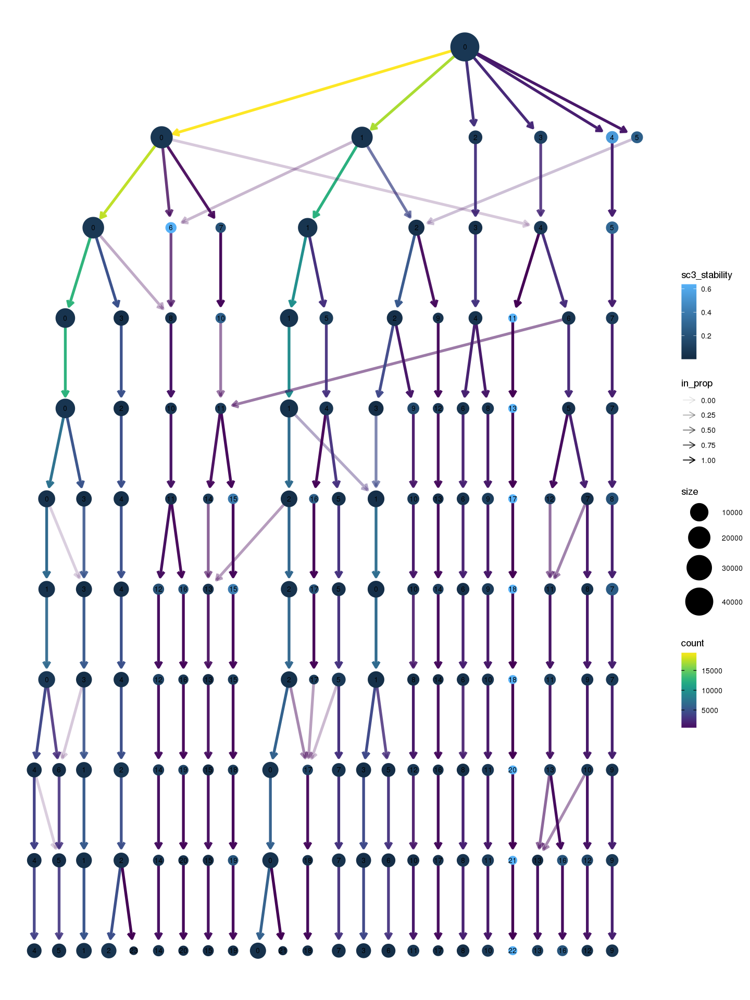

In [24]:
options(repr.plot.width=12, repr.plot.height=16)
clustree(integrated, node_colour = "sc3_stability")

In [25]:
zz<-clustree:::calc_sc3_stability(integrated[[]][,6:16])
data.frame(zz) %>% group_by(resolution) %>% summarise(mean(stability),sd(stability)/mean(stability))

resolution,mean(stability),sd(stability)/mean(stability)
<dbl>,<dbl>,<dbl>
1,0.06745341,NA
2,0.18331875,1.050694
3,0.17465586,1.202799
4,0.12072986,1.456064
5,0.10336981,1.521004
6,0.12293337,1.313086
7,0.13490346,1.177833
8,0.08812436,1.553704
9,0.08487488,1.548820


In [10]:
DefaultAssay(object = integrated) <- "integrated"

# t-SNE and Clustering
integrated <- RunUMAP(object = integrated, reduction = "pca", dims = 1:30)
integrated = RunTSNE(integrated, reduction = "pca", dims = 1:30,max_iter=2000)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
17:46:59 UMAP embedding parameters a = 0.9922 b = 1.112

17:46:59 Read 44163 rows and found 30 numeric columns

17:46:59 Using Annoy for neighbor search, n_neighbors = 30

17:46:59 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

17:47:08 Writing NN index file to temp file /tmp/RtmpBmP5fI/file25ab3128e1c78

17:47:08 Searching Annoy index using 1 thread, search_k = 3000

17:47:24 Annoy recall = 100%

17:47:25 Commencing smooth kNN distance calibration using 1 thread

17:47:27 Initializing 

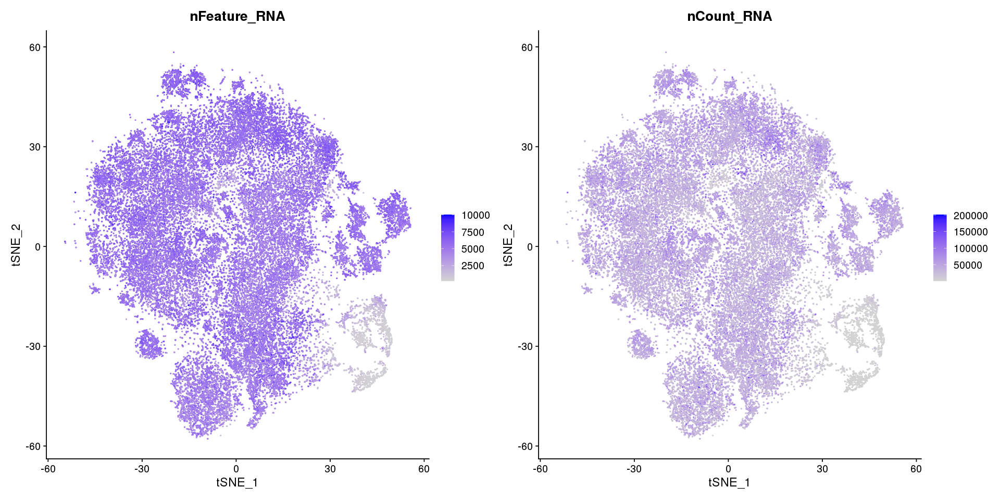

In [11]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(integrated, features = c("nFeature_RNA", "nCount_RNA"), pt.size = 0.25, reduction = "tsne")

In [31]:
head(integrated@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,stim,percent.mt,integrated_snn_res.0,integrated_snn_res.0.1,integrated_snn_res.0.2,integrated_snn_res.0.3,integrated_snn_res.0.4,integrated_snn_res.0.5,integrated_snn_res.0.6,integrated_snn_res.0.7,integrated_snn_res.0.8,integrated_snn_res.0.9,integrated_snn_res.1,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGAGGATATAC-1,Project_1,34902,5159,CL1-0-P,6.890723,0,0,0,0,0,0,1,0,4,4,4,4
AAACCTGAGGGTCTCC-1,Project_1,57950,6302,CL1-0-P,4.880069,0,4,5,7,7,8,7,7,9,9,9,9
AAACCTGCAAGCCTAT-1,Project_1,28025,4588,CL1-0-P,4.157003,0,1,1,1,1,2,2,2,0,0,0,0
AAACCTGCACAGTCGC-1,Project_1,44234,5269,CL1-0-P,3.759551,0,1,1,1,1,2,2,2,0,0,0,0
AAACCTGCACATTTCT-1,Project_1,50946,5665,CL1-0-P,3.232835,0,0,0,0,0,0,1,0,4,2,4,4
AAACCTGGTTAAAGAC-1,Project_1,48819,5701,CL1-0-P,4.363055,0,4,5,7,7,8,7,7,9,9,9,9


Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."


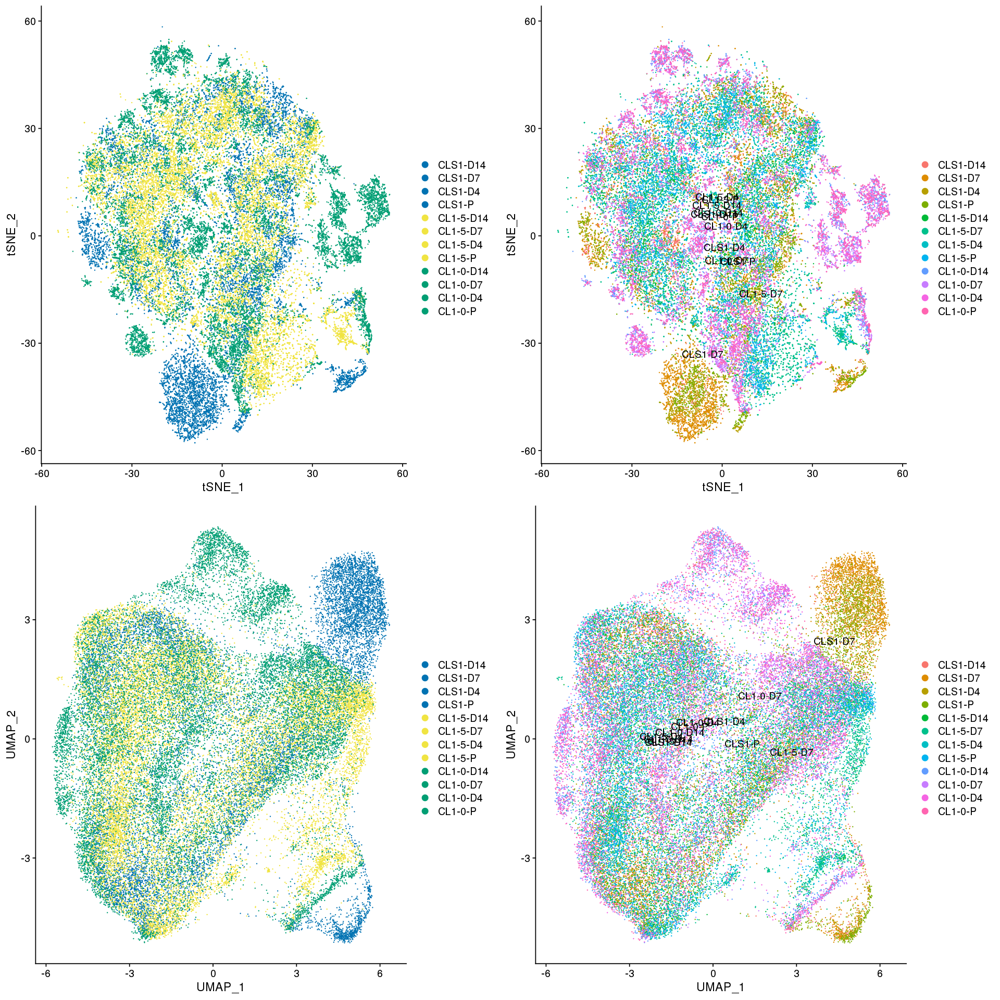

In [14]:
# Visualization
integrated@meta.data$seurat_clusters <- Idents(integrated)<-integrated@meta.data$integrated_snn_res.0.4
options(repr.plot.width=16, repr.plot.height=16)
p1 <- DimPlot(object = integrated, reduction = "tsne", group.by = "stim",order = LABEL, cols = c("CL1-0-P"="#009E73","CL1-0-D4"="#009E73","CL1-0-D7"="#009E73","CL1-0-D14"="#009E73","CL1-5-P"="#F0E442","CL1-5-D4"="#F0E442","CL1-5-D7"="#F0E442","CL1-5-D14"="#F0E442","CLS1-P"="#0072B2","CLS1-D4"="#0072B2","CLS1-D7"="#0072B2","CLS1-D14"="#0072B2"))#+scale_fill_manual(values=c("#009E73", "#F0E442", "#0072B2", "#D55E00"))
p2 <- DimPlot(object = integrated, reduction = "tsne", label = TRUE, group.by = "stim", order = LABEL)
p3 <- DimPlot(object = integrated, reduction = "umap", group.by = "stim",order = LABEL, cols = c("CL1-0-P"="#009E73","CL1-0-D4"="#009E73","CL1-0-D7"="#009E73","CL1-0-D14"="#009E73","CL1-5-P"="#F0E442","CL1-5-D4"="#F0E442","CL1-5-D7"="#F0E442","CL1-5-D14"="#F0E442","CLS1-P"="#0072B2","CLS1-D4"="#0072B2","CLS1-D7"="#0072B2","CLS1-D14"="#0072B2"))#+scale_fill_manual(values=c("#009E73", "#F0E442", "#0072B2", "#D55E00"))
p4 <- DimPlot(object = integrated, reduction = "umap", label = TRUE, group.by = "stim", order = LABEL)
plot_grid(p1, p2, p3, p4)

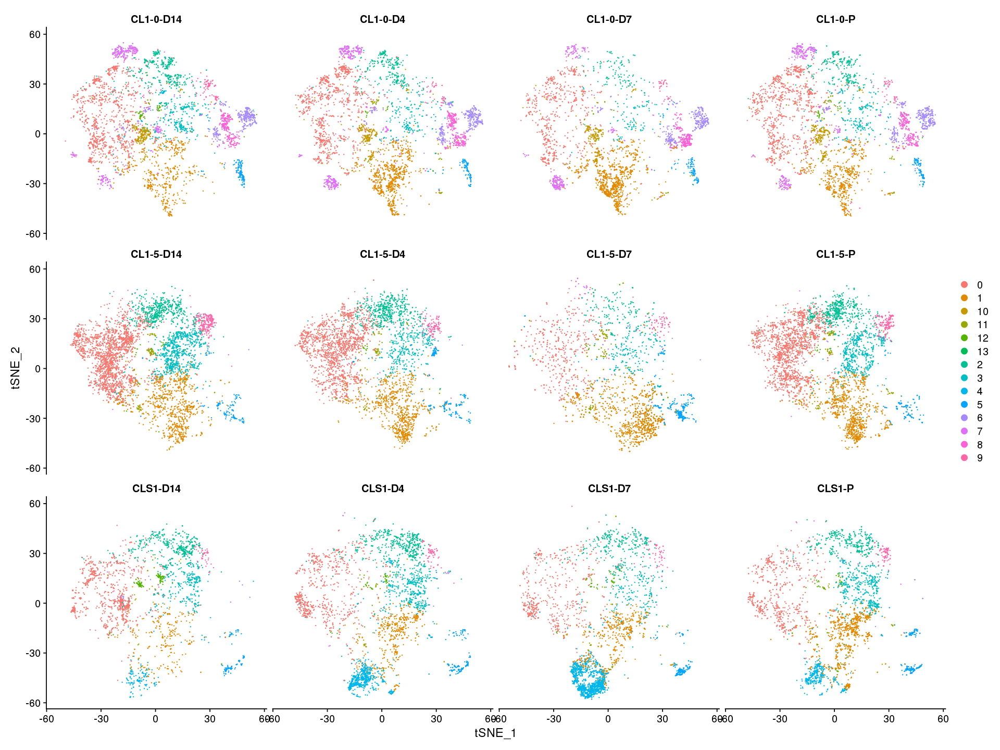

In [16]:
options(repr.plot.width=16, repr.plot.height=12)
DimPlot(object = integrated, reduction = "tsne", split.by = "stim", ncol = 4)

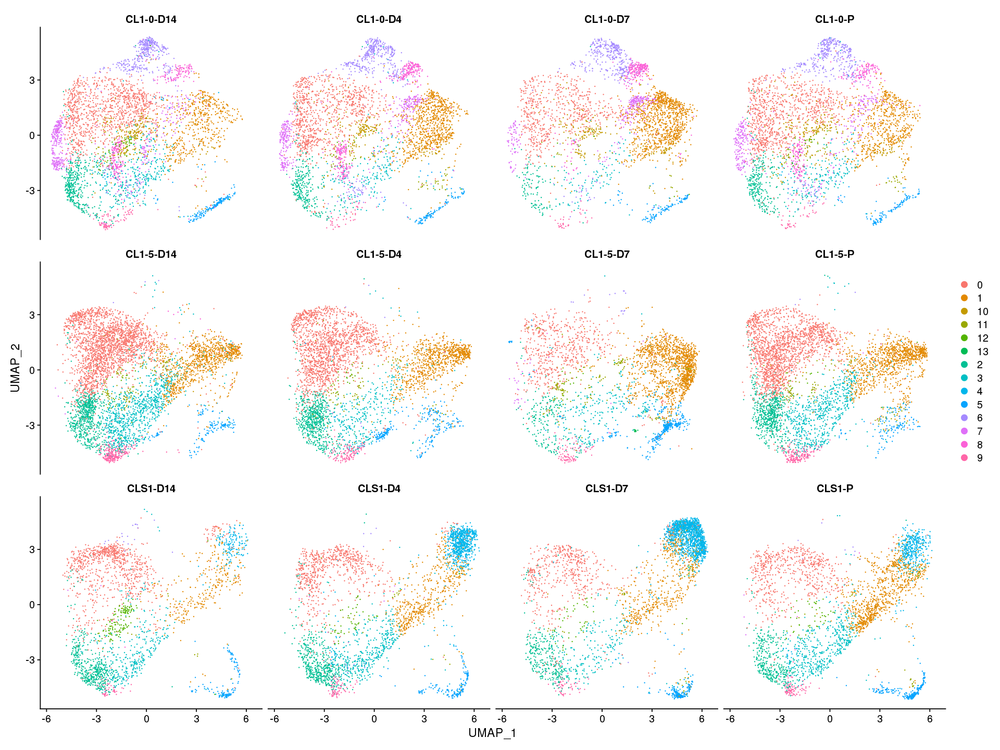

In [15]:
options(repr.plot.width=16, repr.plot.height=12)
DimPlot(object = integrated, reduction = "umap", split.by = "stim", ncol = 4)

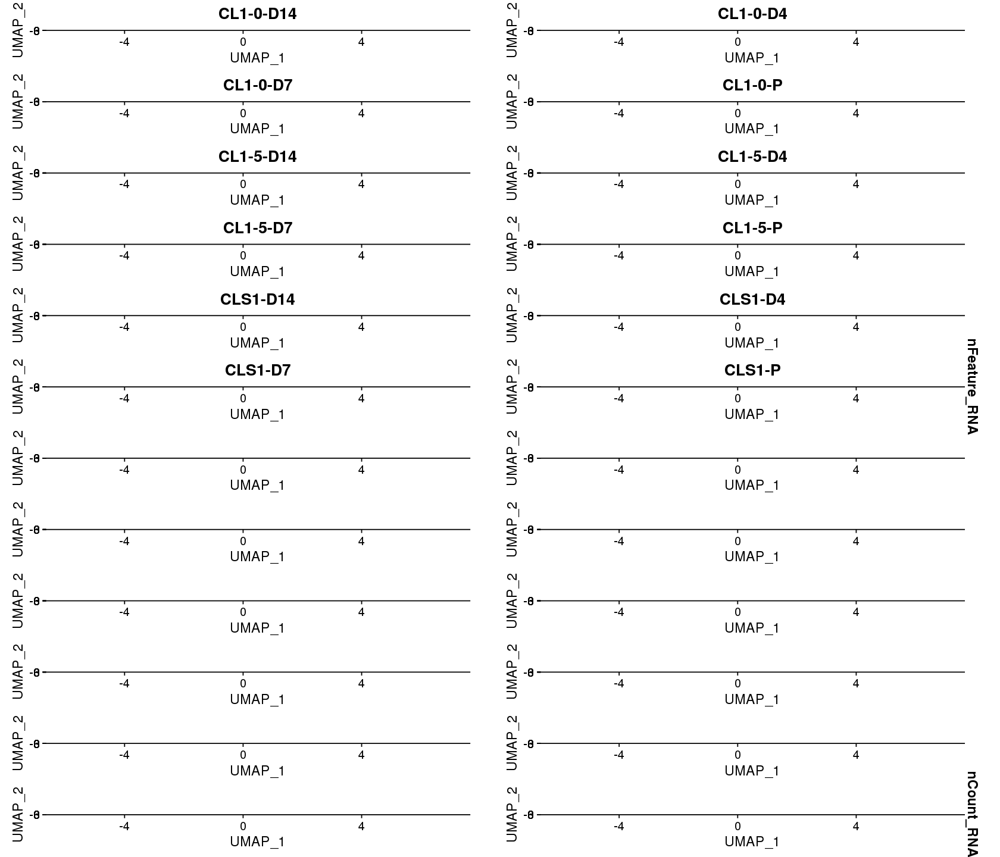

In [49]:
options(repr.plot.width=14, repr.plot.height=12)
FeaturePlot(integrated, features = c("nFeature_RNA", "nCount_RNA"), pt.size = 0.1, split.by = "stim", ncol = 4, ,col=c("green", "red"))

In [50]:
plot.data <- integrated@meta.data %>%
    select(stim, cluster = seurat_clusters)%>%
    mutate(cluster = factor(cluster))%>%
    mutate(stim = factor(stim,levels = LABEL))%>%
    group_by(cluster, stim)%>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count))%>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(stim) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

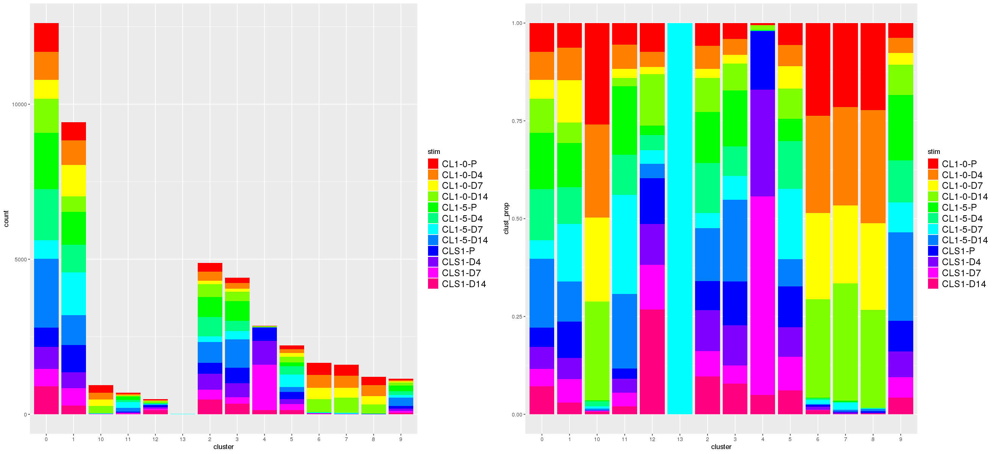

In [68]:
options(repr.plot.width=22, repr.plot.height=10)

p1<-ggplot(plot.data, aes(x = cluster, y = count, fill = stim)) +
    geom_col()+
    scale_fill_manual(values=rainbow(12))+
    theme(legend.text=element_text(size=15))

p2<-ggplot(plot.data, aes(x = cluster, y = clust_prop, fill = stim)) +
    geom_col()+
    scale_fill_manual(values=rainbow(12))+
    theme(legend.text=element_text(size=15))
plot_grid(p1, p2)

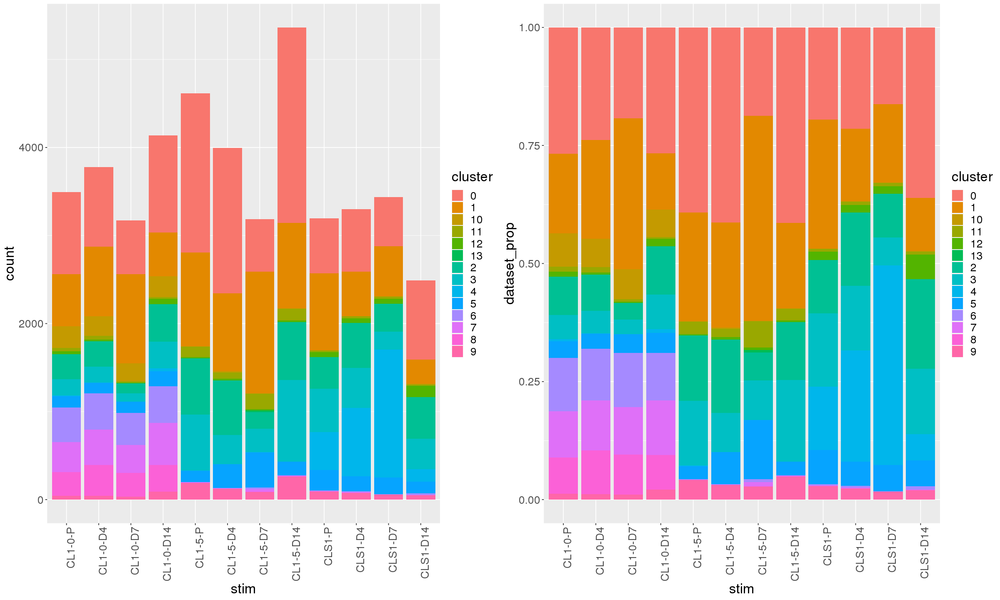

In [58]:
p3<-ggplot(plot.data, aes(x = stim, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

p4<-ggplot(plot.data, aes(x = stim, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(p3, p4)

In [266]:
table(integrated[[]]$seurat_clusters)


    0     1    10    11    12    13     2     3     4     5     6     7     8 
12619  9420   946   692   489    17  4886  4410  2859  2221  1658  1594  1209 
    9 
 1143 

<font size=5>Different expression</font>

In [273]:
DefaultAssay(object = integrated) <- "integrated"
markers <- FindAllMarkers(object = integrated,min.pct = 0.1,logfc.threshold = 0.1, test.use="MAST")

Calculating cluster 0

Assuming data assay in position 1, with name et is log-transformed.


 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>----------

In [4]:
#saveRDS(file ="Project1_Seurat.rds" ,object = integrated)
integrated <- readRDS(file ="Project1_Seurat.rds")

In [278]:
top20 <- markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)
head(top20)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,0.8850451,1.000,0.996,0,0,HIST1H4C
0,0.3842931,0.992,0.915,0,0,CLSPN
0,0.3617702,0.992,0.934,0,0,GINS2
0,0.3481869,0.995,0.905,0,0,PCLAF
0,0.3393643,0.998,0.958,0,0,TK1
0,0.3138523,0.985,0.928,0,0,ATAD2


In [279]:
plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(object = integrated, slot = 'scale.data')[top20$gene ,cells <- colnames(x = integrated)]))))

In [281]:
#annotation
annotation_col<-integrated@meta.data[,c("stim","seurat_clusters"), drop = FALSE]
annotation_col<-annotation_col[order(annotation_col$seurat_clusters,annotation_col$stim),]
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)

In [394]:
aka3 = list(stim = c("CL1-0-P"="#FF0000FF","CL1-0-D4"="#FF8000FF","CL1-0-D7"="#FFFF00FF","CL1-0-D14"="#80FF00FF","CL1-5-P"="#00FF00FF","CL1-5-D4"="#00FF80FF","CL1-5-D7"="#00FFFFFF","CL1-5-D14"="#0080FFFF","CLS1-P"="#0000FFFF","CLS1-D4"="#8000FFFF","CLS1-D7"="#FF00FFFF","CLS1-D14"="#FF0080FF"))
aka3

$stim
    CL1-0-P    CL1-0-D4    CL1-0-D7   CL1-0-D14     CL1-5-P    CL1-5-D4 
"#FF0000FF" "#FF8000FF" "#FFFF00FF" "#80FF00FF" "#00FF00FF" "#00FF80FF" 
   CL1-5-D7   CL1-5-D14      CLS1-P     CLS1-D4     CLS1-D7    CLS1-D14 
"#00FFFFFF" "#0080FFFF" "#0000FFFF" "#8000FFFF" "#FF00FFFF" "#FF0080FF"

In [401]:
options(repr.plot.width = 30, repr.plot.height = 120)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(top20$cluster)),
         gaps_col = cumsum(table(annotation_col$seurat_clusters)),
         color = greenred(100),
         fontsize_row=11
         )

png 
  2

In [403]:
plot_heatmap

,AAACCTGAGTACGTTC-4,AAACCTGTCAAACAAG-4,AAACCTGTCAGGCCCA-4,AAACGGGGTCCTGCTT-4,AAACGGGTCGAGAGCA-4,AAAGATGCATTGAGCT-4,AAAGATGGTTGTACAC-4,AAAGATGTCCTTTACA-4,AAAGCAACAGTCGTGC-4,AAAGCAACATAGTAAG-4,...,TTCCCAGTCCACGTTC-9,TTCTACAAGGCGACAT-9,TTGAACGGTAGCGCTC-9,TTGACTTAGGCCCTCA-9,TTGCCGTCACATGACT-9,TTGCCGTTCAACGGGA-9,TTTATGCGTGGCGAAT-9,TTTCCTCCACTGTTAG-9,TTTCCTCGTTGATTCG-9,TTTGGTTGTCGAATCT-9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HIST1H4C,1.12867364,1.22851310,1.27907350,-0.63175626,1.23176145,0.86543750,0.83311409,1.894355623,1.87642127,0.90600265,...,-1.65558396,-1.022696713,-1.466106807,-1.04585138,-1.3843570,-1.92617419,-1.21468660,-0.93277512,-0.16484359,-1.41168457
CLSPN,0.17928452,0.31627674,0.88043050,0.63099470,0.47696376,0.90443822,1.42500566,1.603425507,1.12314938,0.66138345,...,-0.51067763,0.138732673,-0.401223567,1.33210345,0.2421015,-0.38089984,-0.47837138,-0.30959053,0.35695979,0.15409512
GINS2,1.69438888,0.92474445,0.90066609,0.63966591,0.26712974,1.59473320,1.77417668,0.331813442,1.64282590,1.15322678,...,-0.13262940,-0.196270425,-0.190007508,-0.72752859,-0.6372226,-0.86175397,-0.48156670,-0.88075493,-0.81232296,-0.19098054
PCLAF,-0.76969379,0.87758327,0.41205822,1.17556437,0.59965884,1.42208614,1.43926076,-0.844231279,0.58743493,0.39273633,...,0.53184681,0.602147414,-0.376956207,0.18247472,-0.2462497,0.59144770,1.34648307,-0.20039487,0.45921816,0.29766842
TK1,0.95168929,0.21341628,-0.02508497,0.19531541,0.93057065,-0.76416508,1.06275504,0.448198305,-0.14966079,0.97838176,...,-0.76928448,0.056645832,-0.156138610,-0.02607422,-0.1657424,0.22919067,-0.79751542,-0.16417112,-0.10308947,-0.28117679
ATAD2,-0.36454963,1.10024522,-0.26253314,0.50806119,-0.04485602,0.07849857,0.69840233,0.309114115,1.37717550,0.09411687,...,0.61665326,-0.517781840,0.112094299,-0.69115345,-0.7839819,0.71638042,-0.05496633,1.01334114,-0.06634483,-0.71713840
USP1,1.11338361,1.08840023,0.24216375,0.34782219,-0.12449911,0.39978646,0.36544334,1.164041918,0.89372015,0.50645223,...,-0.23105522,-1.261955851,-0.281626362,0.42029836,1.1413433,1.50962403,0.99624131,0.87228819,0.66156298,0.39130743
CDT1,0.36448673,1.35055516,0.23709600,1.17962884,0.55624275,0.58425479,0.60161676,-0.134100092,2.22791900,1.07753935,...,1.17419250,-0.661252228,-0.389907512,1.21300181,0.5881177,-0.57232255,0.32324913,-0.68153228,0.15705092,0.02244530
MYBL2,-0.01769800,0.25569988,1.65802310,-0.31553087,0.10211148,0.26675890,-0.05846463,0.752428614,1.04886424,0.56997575,...,0.03633979,-0.509545769,-0.291987144,1.42153526,0.6412096,-0.06403297,-1.04279988,0.19724622,-0.03351137,-0.59221263


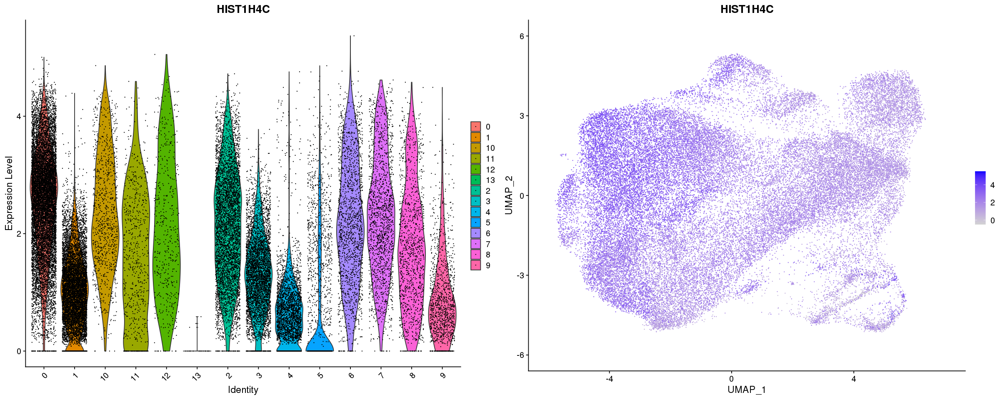

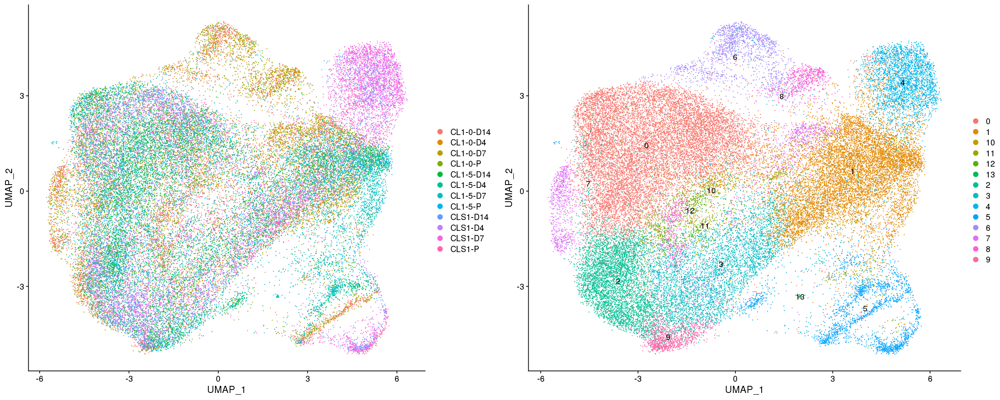

In [406]:
options(repr.plot.width=20, repr.plot.height=8)
gene_SET<-c('HIST1H4C')
# options(repr.plot.width=12, repr.plot.height=6)
p1 <- DimPlot(object = integrated, reduction = "umap", group.by = "stim")+scale_fill_manual(values=rainbow(12))
p2 <- DimPlot(object = integrated, reduction = "umap", label = TRUE)
plot_grid(VlnPlot(integrated,gene_SET,assay = "RNA",pt.size = 0.01), FeaturePlot(integrated, gene_SET))
plot_grid(p1, p2,ncol = 2)

In [84]:
integrated[[]] %>% group_by(stim) %>% summarise(min(nCount_RNA))

stim,min(nCount_RNA)
<chr>,<dbl>
CL1-0-D14,505
CL1-0-D4,500
CL1-0-D7,503
CL1-0-P,507
CL1-5-D14,509
CL1-5-D4,503
CL1-5-D7,501
CL1-5-P,501
CLS1-D14,622


In [75]:
slot="counts"
DefaultAssay(object = integrated) <- "RNA"
BB <- as.data.frame(x = as.matrix(x = t(x = GetAssayData(
    object = integrated,
    slot = slot))))
head(BB[,1:100])

,AL627309.1,AL669831.5,LINC00115,FAM41C,AL645608.3,AL645608.5,AL645608.1,SAMD11,NOC2L,KLHL17,...,C1orf174,LINC01134,NPHP4,KCNAB2,CHD5,RPL22,AL031847.1,RNF207,ICMT,LINC00337
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCTGAGGATATAC-1,0,0,1,0,0,0,0,0,2,1,...,1,0,0,0,0,68,0,0,2,0
AAACCTGAGGGTCTCC-1,0,1,0,0,1,1,0,0,17,0,...,1,0,0,0,2,119,0,1,5,0
AAACCTGCAAGCCTAT-1,0,0,0,0,1,0,0,2,4,0,...,1,0,0,0,0,87,0,0,1,0
AAACCTGCACAGTCGC-1,0,2,0,0,0,0,0,1,1,0,...,1,0,0,0,0,117,0,0,0,0
AAACCTGCACATTTCT-1,0,0,0,0,0,0,0,1,4,0,...,2,0,1,0,0,122,0,0,2,0
AAACCTGGTTAAAGAC-1,0,0,0,0,1,0,0,0,17,2,...,6,0,0,0,1,87,0,1,1,0


In [78]:
slot="counts"
DefaultAssay(object = integrated) <- "RNA"
BB <- as.data.frame(x = as.matrix(x = t(x = GetAssayData(
    object = integrated,
    slot = slot))))
#BB_tmp<-apply(BB,1,function(x) rank(x))
BB_tmp<-apply(BB,1,function(x) rank(x,ties.method = "min"))
#BB_tmp_max<-apply(BB_tmp,2,max)
#BB_relative<-t(t(BB_tmp)/BB_tmp_max)
BB_relative<-apply(BB_tmp,2,function(x){x/max(x)})

In [79]:
target<-c("PTTG1","CENPF")

BB <- data.frame(t(BB_tmp[target,]))

BB_relative_t <- data.frame(t(BB_relative[target,]))

colnames(BB_relative_t)<-paste(target,"relative",sep="_")

AA <- as.data.frame(x = as.matrix(x = t(x = GetAssayData(
    object = integrated,
    slot = slot)[target,cells <- colnames(x = integrated) , drop = FALSE])))

colnames(AA)<-paste(target,slot,sep="_")

In [80]:
BB<-merge(AA,BB,by="row.names",all.x=TRUE)
BB<-merge(BB,BB_relative_t,by.y ="row.names",by.x ="Row.names",all.x=TRUE)
BB<-merge(BB,integrated[[]],by.y ="row.names",by.x ="Row.names",all.x=TRUE)

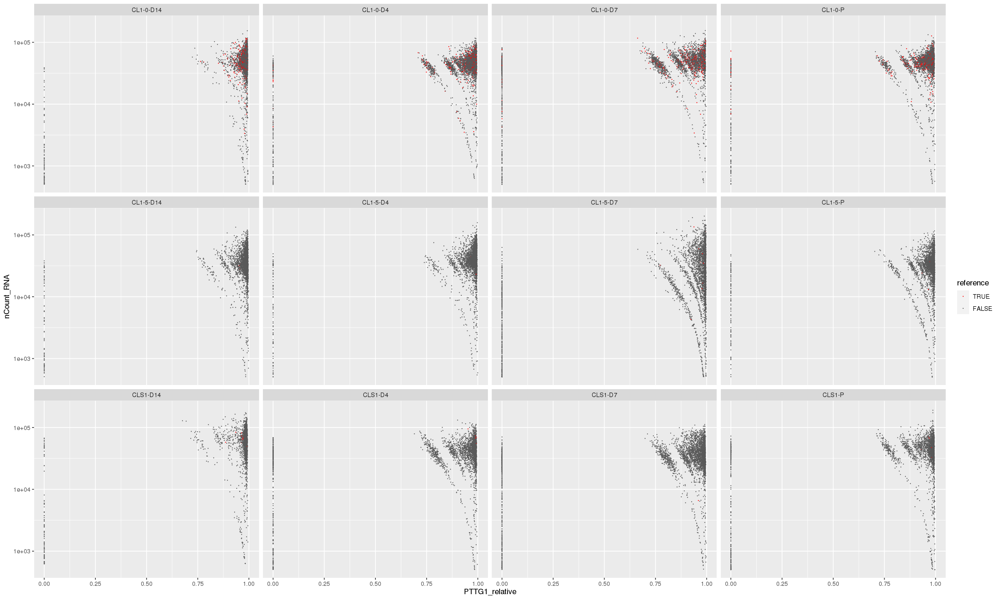

In [83]:
options(repr.plot.width=20, repr.plot.height=12)
#BB<-BB %>% group_by(stim) %>% mutate(reference=seurat_clusters==6)
BB<-BB %>% group_by(stim) %>% mutate(reference=factor(seurat_clusters==6,levels = c(TRUE,FALSE)))
BB %>% ggplot(., aes(x=PTTG1_relative, y=nCount_RNA,color=reference)) +
    geom_point(size = 0.01) +
    facet_wrap("stim")+
    scale_color_manual(values = c('red', '#595959'))+
    scale_y_continuous(trans='log10')#+ geom_vline(xintercept = 10)#+scale_x_continuous(trans='log10')

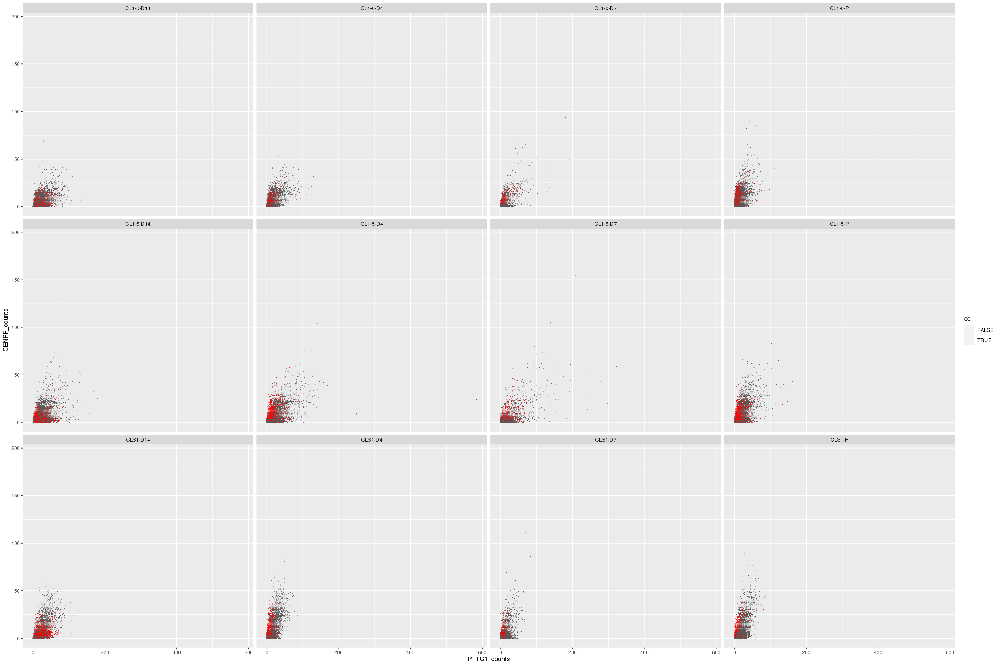

In [111]:
#seurat_clusters
options(repr.plot.width=24, repr.plot.height=16)
BB<-BB %>% group_by(stim) %>% mutate(cc=seurat_clusters==0)
#target<-c("PTTG1","CENPF")
BB %>% ggplot(., aes(x=PTTG1_counts, y=CENPF_counts,color=cc)) + geom_point(size = 0.01) + facet_wrap("stim")+ scale_color_manual(values = c('#595959', 'red'))

In [128]:
ss<-seq(0,max(BB$PTTG1_counts),10)
roc_data<-matrix(NA,length(ss),24)
for(i in 1:length(ss)){
    BB<-BB %>% group_by(stim) %>% mutate(cut=factor(PTTG1_counts>=ss[i],levels = c(TRUE,FALSE)))
    for(j in 1:12){
        BB_sub <- BB %>% subset(stim==LABEL[j])
        table_1<-table(BB_sub$cut,BB_sub$reference)
        roc_data[i,j*2-1]<-table_1[1,1]/sum(table_1[,1])
        roc_data[i,j*2]<-table_1[1,2]/sum(table_1[,2])
    }
}

In [130]:
colnames(roc_data)<-paste(c("TPR","FPR"),rep(LABEL,c(rep(2,12))),sep="_")
roc_data<-data.frame(roc_data)

In [131]:
i=3
BB<-BB %>% group_by(stim) %>% mutate(cut=factor(PTTG1_counts>=ss[2],levels = c(TRUE,FALSE)))
BB_sub <- BB %>% subset(stim==LABEL[i])
as.matrix(table_1<-table(BB_sub$cut,BB_sub$reference))
table_1[1,1]/sum(table_1[,1])
table_1[1,2]/sum(table_1[,2])
LABEL[i]
fisher.test(table_1)

       
        TRUE FALSE
  TRUE    94   619
  FALSE  272  2186

[1] 0.2568306

[1] 0.2206774

[1] "CL1-0-D7"


	Fisher's Exact Test for Count Data

data:  table_1
p-value = 0.1257
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.9388337 1.5762387
sample estimates:
odds ratio 
  1.220394 


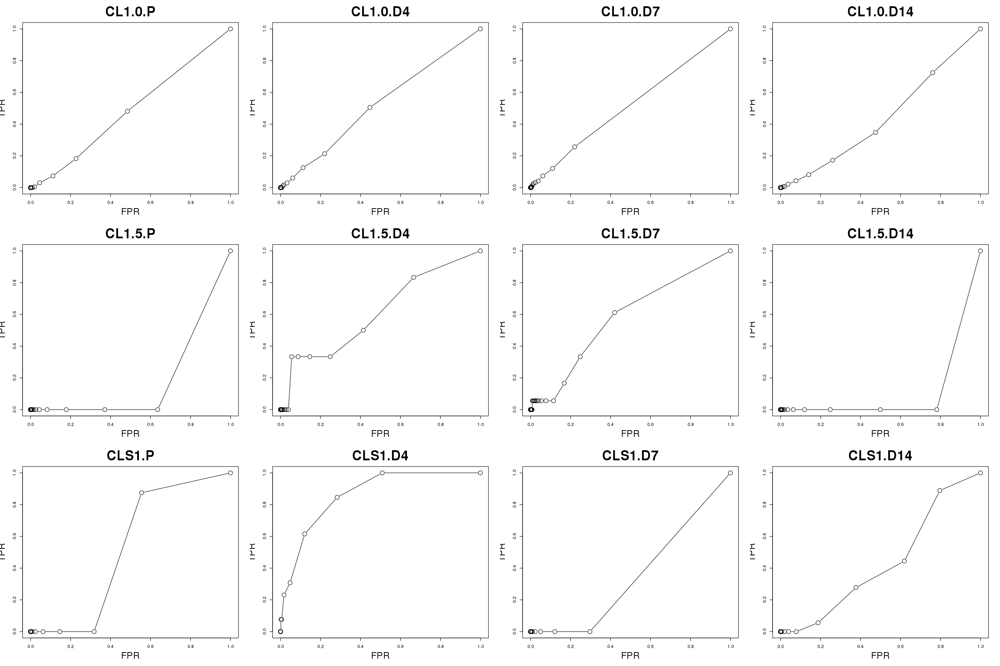

In [214]:
options(repr.plot.width=24, repr.plot.height=16)
par(mfrow=c(3,4))
for(i in c(1:12)){
    main_name <- gsub("-",".",LABEL[i])
    TPR <- paste0("TPR_", main_name)
    FPR <- paste0("FPR_", main_name)
    plot(y=roc_data[, TPR] , x=roc_data[, FPR] , type = "b" , xlab ="FPR" , ylab ="TPR", main = main_name, cex=2, cex.lab=2 ,cex.main=3)
}

In [136]:
head(roc_data)

,TPR_CL1.0.P,FPR_CL1.0.P,TPR_CL1.0.D4,FPR_CL1.0.D4,TPR_CL1.0.D7,FPR_CL1.0.D7,TPR_CL1.0.D14,FPR_CL1.0.D14,TPR_CL1.5.P,FPR_CL1.5.P,...,TPR_CL1.5.D14,FPR_CL1.5.D14,TPR_CLS1.P,FPR_CLS1.P,TPR_CLS1.D4,FPR_CLS1.D4,TPR_CLS1.D7,FPR_CLS1.D7,TPR_CLS1.D14,FPR_CLS1.D14
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1.000000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1,1.00000000,...,1,1.00000000,1.000,1.00000000,1.0000000,1.00000000,1,1.00000000,1.00000000,1.00000000
2,0.480916031,0.48435988,0.50485437,0.44708680,0.25683060,0.22067736,0.72422062,0.76116192,0,0.63610750,...,0,0.78157060,0.875,0.55524168,1.0000000,0.50882532,0,0.29714785,0.88888889,0.79668553
3,0.183206107,0.22766849,0.21359223,0.22057075,0.12021858,0.11051693,0.34772182,0.47498655,0,0.37147811,...,0,0.49934714,0.000,0.31795355,0.8461538,0.28332319,0,0.12136205,0.44444444,0.61964430
4,0.073791349,0.11222186,0.12621359,0.11296076,0.07377049,0.06167558,0.17266187,0.26062399,0,0.17858691,...,0,0.24883417,0.000,0.14595104,0.6153846,0.12081558,0,0.05034924,0.27777778,0.37752627
5,0.030534351,0.04546920,0.06067961,0.06093936,0.04098361,0.03778966,0.08153477,0.14093599,0,0.08300824,...,0,0.11975378,0.000,0.06277464,0.3076923,0.04777845,0,0.02357392,0.05555556,0.18755053
6,0.005089059,0.01999355,0.02912621,0.03210464,0.03278689,0.02388592,0.04316547,0.07719204,0,0.04399653,...,0,0.06379407,0.000,0.02354049,0.2307692,0.01734632,0,0.01018626,0.00000000,0.07881973


In [45]:
?FeaturePlot

FeaturePlot {Seurat},R Documentation
object,Seurat object
features,"Vector of features to plot. Features can come from: An Assay feature (e.g. a gene name - ""MS4A1"") A column name from meta.data (e.g. mitochondrial percentage - ""percent.mito"") A column name from a DimReduc object corresponding to the cell embedding values (e.g. the PC 1 scores - ""PC_1"")"
dims,"Dimensions to plot, must be a two-length numeric vector specifying x- and y-dimensions"
cells,Vector of cells to plot (default is all cells)
cols,"The two colors to form the gradient over. Provide as string vector with the first color corresponding to low values, the second to high. Also accepts a Brewer color scale or vector of colors. Note: this will bin the data into number of colors provided. When blend is TRUE, takes anywhere from 1-3 colors: 1 color:Treated as color for double-negatives, will use default colors 2 and 3 for per-feature expression 2 colors:Treated as colors for per-feature expression, will use default color 1 for double-negatives 3+ colors:First color used for double-negatives, colors 2 and 3 used for per-feature expression, all others ignored"
pt.size,Adjust point size for plotting
order,Boolean determining whether to plot cells in order of expression. Can be useful if cells expressing given feature are getting buried.
"min.cutoff, max.cutoff","Vector of minimum and maximum cutoff values for each feature, may specify quantile in the form of 'q##' where '##' is the quantile (eg, 'q1', 'q10')"
reduction,"Which dimensionality reduction to use. If not specified, first searches for umap, then tsne, then pca"
split.by,"A factor in object metadata to split the feature plot by, pass 'ident' to split by cell identity'; similar to the old FeatureHeatmap"
